# Overview
## CTML Take-Home Test
Hello! Thanks again for your interest in a role with CTML. This test consists of two challenges, each to be completed using Python and the usual data science stack, and each intended to take no more than hour.

Once complete, please commit your work to github and send us the link(s) 

# Business Objective & Challenge
## 1: Breast Cancer Dataset EDA
The “wdbc” data-set you will be working with can be downloaded from here.
Please produce a well-presented Jupyter notebook – including any visualisations you feel are useful – which addresses the following:

 a.	What are the mean, median and standard deviation of the “perimeter” feature?

b.	Is the first feature in this data set (the “radius”) normally distributed? Quantify your answer. If not, what might be a more appropriate distribution?

c.	Train a classifier to predict the diagnosis of malignant or benign. Compare the results of two classifiers e.g. SVM, logistic regression, decision tree etc.

# ML Development Process


## Import Packeges

The following code is written in Python 3.x. Libraries provide pre-written functionality to perform necessary tasks.

In [149]:
# Python Libraries for Data Cleaning and Manipulation
import sys #access to system parameters 
import collections
import numpy as np
import pandas as pd
import scipy as sp #collection of functions for scientific computing and advance mathematics
import math
import itertools
import imblearn
from imblearn.over_sampling import SMOTE
from collections import Counter

# Python Libraries for Data Visualization
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.colors
import seaborn as sns
from pandas.plotting import scatter_matrix
import matplotlib.pylab as pylab
from pandas.plotting import scatter_matrix
import seaborn as sns
from mpl_toolkits.mplot3d import axes3d
from numpy.random import seed
from numpy.random import randn
from scipy.stats import anderson
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import shapiro

# Python Libraries for Model Helpers and Model Algorithms
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn import feature_selection
from sklearn import model_selection
from sklearn import metrics
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix
from sklearn import preprocessing
from sklearn.decomposition import PCA 
from sklearn.manifold import TSNE
from sklearn.feature_selection import SelectKBest,chi2
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
from sklearn import svm
from sklearn import tree
from sklearn.model_selection import train_test_split, cross_val_score
import time

#Python Libraries for Model Algorithms
from sklearn import svm, tree, linear_model, neighbors, naive_bayes, ensemble, discriminant_analysis, gaussian_process
from xgboost import XGBClassifier


#Python Libraries for Model Interpretability
from lime import lime_text
from lime.lime_text import LimeTextExplainer
import shap


#misc libraries
import random
import time

#ignore warnings
pd.set_option("display.precision", 2)
import warnings
warnings.filterwarnings('ignore')
print('*'*100)
print('-'*31,'Your ML libraries have been loaded.','-'*31)
print('*'*100)


%matplotlib inline

# Set Random Seed
np.random.seed(42)
np.random.RandomState(42)

****************************************************************************************************
------------------------------- Your ML libraries have been loaded. -------------------------------
****************************************************************************************************


RandomState(MT19937) at 0x2BE00A43140

## Data Reading

### Attribute Information:

5. Number of instances: 569 

6. Number of attributes: 32 (ID, diagnosis, 30 real-valued input features)

7. Attribute information

1) ID number
2) Diagnosis (M = malignant, B = benign)
3-32)

Ten real-valued features are computed for each cell nucleus:

	a) radius (mean of distances from center to points on the perimeter)
	b) texture (standard deviation of gray-scale values)
	c) perimeter
	d) area
	e) smoothness (local variation in radius lengths)
	f) compactness (perimeter^2 / area - 1.0)
	g) concavity (severity of concave portions of the contour)
	h) concave points (number of concave portions of the contour)
	i) symmetry 
	j) fractal dimension ("coastline approximation" - 1)

Several of the papers listed above contain detailed descriptions of
how these features are computed. 

The mean, standard error, and "worst" or largest (mean of the three
largest values) of these features were computed for each image,
resulting in 30 features.  For instance, field 3 is Mean Radius, field
13 is Radius SE, field 23 is Worst Radius.

All feature values are recoded with four significant digits.

8. Missing attribute values: none

9. Class distribution: 357 benign, 212 malignant

In [105]:
# Reading Data from Web
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data', header=None)

# Assign Variable name to datasets
df.columns = ['ID_number', 'Diagnosis', 'radius_mean', 'texture_mean','perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean','concavity_mean','concave_points_mean','symmetry_mean','fractal_dimension_mean',
             'radius_SE', 'texture_SE','perimeter_SE', 'area_SE', 'smoothness_SE', 'compactness_SE','concavity_SE','concave_points_SE','symmetry_SE','fractal_dimension_SE',
              'radius_Worst', 'texture_Worst','perimeter_Worst', 'area_Worst', 'smoothness_Worst', 'compactness_Worst','concavity_Worst','concave_points_Worst','symmetry_Worst','fractal_dimension_Worst'
             ]

#df = df.drop(['ID number'],axis=1)
print('Number of instances = %d' % (df.shape[0]))
print('Number of attributes = %d' % (df.shape[1]))
df.head()

Number of instances = 569
Number of attributes = 32


,ID_number,Diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_Worst,texture_Worst,perimeter_Worst,area_Worst,smoothness_Worst,compactness_Worst,concavity_Worst,concave_points_Worst,symmetry_Worst,fractal_dimension_Worst
0,842302,M,17.99,10.38,122.80,1001.0,0.12,0.28,0.30,0.15,...,25.38,17.33,184.60,2019.0,0.16,0.67,0.71,0.27,0.46,0.12
1,842517,M,20.57,17.77,132.90,1326.0,0.08,0.08,0.09,0.07,...,24.99,23.41,158.80,1956.0,0.12,0.19,0.24,0.19,0.28,0.09
2,84300903,M,19.69,21.25,130.00,1203.0,0.11,0.16,0.20,0.13,...,23.57,25.53,152.50,1709.0,0.14,0.42,0.45,0.24,0.36,0.09
3,84348301,M,11.42,20.38,77.58,386.1,0.14,0.28,0.24,0.11,...,14.91,26.50,98.87,567.7,0.21,0.87,0.69,0.26,0.66,0.17
4,84358402,M,20.29,14.34,135.10,1297.0,0.10,0.13,0.20,0.10,...,22.54,16.67,152.20,1575.0,0.14,0.20,0.40,0.16,0.24,0.08


In [106]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID_number                569 non-null    int64  
 1   Diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave_points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_SE                569 non-null    float64
 13  texture_SE               569 non-null    float64
 14  perimeter_SE             5

## Data Quality

In [107]:
# Errors due to incomplete information
mask = df.isna().any()
list_columns = df.columns[mask].tolist()
#sns.heatmap(df[list_columns].isnull())
try:
    None in list_columns
    print(f" Error while reading file {list_columns} ")
except:
    sns.heatmap(df[list_columns].isnull())

 Error while reading file [] 


## Summarizing Missing Values

In [108]:
# Total missing values for each feature
pd.set_option("display.max.rows", None)

def missing_count(x):
    return sum(x.isnull())

print("Total number of missing values for each variable")

print(df.apply(missing_count,axis=0))

print("Total number of missing values for all variable")
print(df.isnull().sum().sum())

Total number of missing values for each variable
ID_number                  0
Diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave_points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_SE                  0
texture_SE                 0
perimeter_SE               0
area_SE                    0
smoothness_SE              0
compactness_SE             0
concavity_SE               0
concave_points_SE          0
symmetry_SE                0
fractal_dimension_SE       0
radius_Worst               0
texture_Worst              0
perimeter_Worst            0
area_Worst                 0
smoothness_Worst           0
compactness_Worst          0
concavity_Worst            0
concave_points_Worst       0
symmetry_Worst             0
fractal_dimension_Worst    0
dtype: int64
Total numb

## Descriptive Statistics

### Descriptive Statistics for Continuous variable

In [109]:
#print(df.describe())
df

,ID_number,Diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_Worst,texture_Worst,perimeter_Worst,area_Worst,smoothness_Worst,compactness_Worst,concavity_Worst,concave_points_Worst,symmetry_Worst,fractal_dimension_Worst
0,842302,M,17.99,10.38,122.80,1001.0,0.12,0.28,3.00e-01,1.47e-01,...,25.38,17.33,184.60,2019.0,0.16,0.67,7.12e-01,2.65e-01,0.46,0.12
1,842517,M,20.57,17.77,132.90,1326.0,0.08,0.08,8.69e-02,7.02e-02,...,24.99,23.41,158.80,1956.0,0.12,0.19,2.42e-01,1.86e-01,0.28,0.09
2,84300903,M,19.69,21.25,130.00,1203.0,0.11,0.16,1.97e-01,1.28e-01,...,23.57,25.53,152.50,1709.0,0.14,0.42,4.50e-01,2.43e-01,0.36,0.09
3,84348301,M,11.42,20.38,77.58,386.1,0.14,0.28,2.41e-01,1.05e-01,...,14.91,26.50,98.87,567.7,0.21,0.87,6.87e-01,2.58e-01,0.66,0.17
4,84358402,M,20.29,14.34,135.10,1297.0,0.10,0.13,1.98e-01,1.04e-01,...,22.54,16.67,152.20,1575.0,0.14,0.20,4.00e-01,1.63e-01,0.24,0.08
5,843786,M,12.45,15.70,82.57,477.1,0.13,0.17,1.58e-01,8.09e-02,...,15.47,23.75,103.40,741.6,0.18,0.52,5.35e-01,1.74e-01,0.40,0.12
6,844359,M,18.25,19.98,119.60,1040.0,0.09,0.11,1.13e-01,7.40e-02,...,22.88,27.66,153.20,1606.0,0.14,0.26,3.78e-01,1.93e-01,0.31,0.08
7,84458202,M,13.71,20.83,90.20,577.9,0.12,0.16,9.37e-02,5.99e-02,...,17.06,28.14,110.60,897.0,0.17,0.37,2.68e-01,1.56e-01,0.32,0.12
8,844981,M,13.00,21.82,87.50,519.8,0.13,0.19,1.86e-01,9.35e-02,...,15.49,30.73,106.20,739.3,0.17,0.54,5.39e-01,2.06e-01,0.44,0.11
9,84501001,M,12.46,24.04,83.97,475.9,0.12,0.24,2.27e-01,8.54e-02,...,15.09,40.68,97.65,711.4,0.19,1.06,1.10e+00,2.21e-01,0.44,0.21


sq = np.sqrt(len(df))
df['perimeter_std'] = df['perimeter_SE']*sq


In [110]:
   
#mean_f = np.concatenate([['Diagnosis'], df.iloc[:,1:11].columns.tolist()])
error_f =  df.iloc[:,12:22]
#worst_f = np.concatenate([['Diagnosis'], df.iloc[:,21:31].columns.tolist()])    
error_f

,radius_SE,texture_SE,perimeter_SE,area_SE,smoothness_SE,compactness_SE,concavity_SE,concave_points_SE,symmetry_SE,fractal_dimension_SE
0,1.09,0.91,8.59,153.40,6.40e-03,4.90e-02,5.37e-02,1.59e-02,3.00e-02,6.19e-03
1,0.54,0.73,3.40,74.08,5.22e-03,1.31e-02,1.86e-02,1.34e-02,1.39e-02,3.53e-03
2,0.75,0.79,4.58,94.03,6.15e-03,4.01e-02,3.83e-02,2.06e-02,2.25e-02,4.57e-03
3,0.50,1.16,3.44,27.23,9.11e-03,7.46e-02,5.66e-02,1.87e-02,5.96e-02,9.21e-03
4,0.76,0.78,5.44,94.44,1.15e-02,2.46e-02,5.69e-02,1.88e-02,1.76e-02,5.11e-03
5,0.33,0.89,2.22,27.19,7.51e-03,3.35e-02,3.67e-02,1.14e-02,2.16e-02,5.08e-03
6,0.45,0.77,3.18,53.91,4.31e-03,1.38e-02,2.25e-02,1.04e-02,1.37e-02,2.18e-03
7,0.58,1.38,3.86,50.96,8.81e-03,3.03e-02,2.49e-02,1.45e-02,1.49e-02,5.41e-03
8,0.31,1.00,2.41,24.32,5.73e-03,3.50e-02,3.55e-02,1.23e-02,2.14e-02,3.75e-03
9,0.30,1.60,2.04,23.94,7.15e-03,7.22e-02,7.74e-02,1.43e-02,1.79e-02,1.01e-02


In [111]:
def std(df):
    sq = pow(len(df), .05)
    std = df * sq
    return  std

In [112]:
df[["std1","std2","std3","std4","std5","std6","std7","std8","std9","std10"]] = error_f.apply(std)

In [113]:
df

,ID_number,Diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,std1,std2,std3,std4,std5,std6,std7,std8,std9,std10
0,842302,M,17.99,10.38,122.80,1001.0,0.12,0.28,3.00e-01,1.47e-01,...,1.50,1.24,11.80,210.66,8.79e-03,6.73e-02,7.38e-02,2.18e-02,0.04,8.50e-03
1,842517,M,20.57,17.77,132.90,1326.0,0.08,0.08,8.69e-02,7.02e-02,...,0.75,1.01,4.67,101.73,7.18e-03,1.80e-02,2.55e-02,1.84e-02,0.02,4.85e-03
2,84300903,M,19.69,21.25,130.00,1203.0,0.11,0.16,1.97e-01,1.28e-01,...,1.02,1.08,6.30,129.13,8.45e-03,5.50e-02,5.26e-02,2.83e-02,0.03,6.28e-03
3,84348301,M,11.42,20.38,77.58,386.1,0.14,0.28,2.41e-01,1.05e-01,...,0.68,1.59,4.73,37.39,1.25e-02,1.02e-01,7.77e-02,2.56e-02,0.08,1.26e-02
4,84358402,M,20.29,14.34,135.10,1297.0,0.10,0.13,1.98e-01,1.04e-01,...,1.04,1.07,7.47,129.69,1.58e-02,3.38e-02,7.81e-02,2.59e-02,0.02,7.02e-03
5,843786,M,12.45,15.70,82.57,477.1,0.13,0.17,1.58e-01,8.09e-02,...,0.46,1.22,3.04,37.34,1.03e-02,4.59e-02,5.04e-02,1.56e-02,0.03,6.98e-03
6,844359,M,18.25,19.98,119.60,1040.0,0.09,0.11,1.13e-01,7.40e-02,...,0.61,1.06,4.37,74.03,5.92e-03,1.90e-02,3.10e-02,1.43e-02,0.02,2.99e-03
7,84458202,M,13.71,20.83,90.20,577.9,0.12,0.16,9.37e-02,5.99e-02,...,0.80,1.89,5.30,69.98,1.21e-02,4.16e-02,3.42e-02,1.99e-02,0.02,7.43e-03
8,844981,M,13.00,21.82,87.50,519.8,0.13,0.19,1.86e-01,9.35e-02,...,0.42,1.38,3.30,33.40,7.87e-03,4.81e-02,4.88e-02,1.68e-02,0.03,5.15e-03
9,84501001,M,12.46,24.04,83.97,475.9,0.12,0.24,2.27e-01,8.54e-02,...,0.41,2.20,2.80,32.88,9.82e-03,9.91e-02,1.06e-01,1.97e-02,0.02,1.38e-02


In [114]:
std_f =  df.iloc[:,32:44]
std_f

,std1,std2,std3,std4,std5,std6,std7,std8,std9,std10
0,1.50,1.24,11.80,210.66,8.79e-03,6.73e-02,7.38e-02,2.18e-02,0.04,8.50e-03
1,0.75,1.01,4.67,101.73,7.18e-03,1.80e-02,2.55e-02,1.84e-02,0.02,4.85e-03
2,1.02,1.08,6.30,129.13,8.45e-03,5.50e-02,5.26e-02,2.83e-02,0.03,6.28e-03
3,0.68,1.59,4.73,37.39,1.25e-02,1.02e-01,7.77e-02,2.56e-02,0.08,1.26e-02
4,1.04,1.07,7.47,129.69,1.58e-02,3.38e-02,7.81e-02,2.59e-02,0.02,7.02e-03
5,0.46,1.22,3.04,37.34,1.03e-02,4.59e-02,5.04e-02,1.56e-02,0.03,6.98e-03
6,0.61,1.06,4.37,74.03,5.92e-03,1.90e-02,3.10e-02,1.43e-02,0.02,2.99e-03
7,0.80,1.89,5.30,69.98,1.21e-02,4.16e-02,3.42e-02,1.99e-02,0.02,7.43e-03
8,0.42,1.38,3.30,33.40,7.87e-03,4.81e-02,4.88e-02,1.68e-02,0.03,5.15e-03
9,0.41,2.20,2.80,32.88,9.82e-03,9.91e-02,1.06e-01,1.97e-02,0.02,1.38e-02


In [115]:
#df[["std1","std2","std3","std4","std5","std6","std7","std8","std9","std10"]] = error_f.apply(std)

In [116]:
def xval(df):
    sq1 = pow(df, 2)
    le = len(df) - 1
    dev = pow((sq1 * le),.05)
    return  dev

In [117]:
df[["dev1","dev2","dev3","dev4","dev5","dev6","dev7","dev8","dev9","dev10"]] = std_f.apply(xval)

In [118]:
df

,ID_number,Diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,dev1,dev2,dev3,dev4,dev5,dev6,dev7,dev8,dev9,dev10
0,842302,M,17.99,10.38,122.80,1001.0,0.12,0.28,3.00e-01,1.47e-01,...,1.43,1.40,1.76,2.34,0.86,1.05,1.06,0.94,1.00,0.85
1,842517,M,20.57,17.77,132.90,1326.0,0.08,0.08,8.69e-02,7.02e-02,...,1.33,1.37,1.60,2.18,0.84,0.92,0.95,0.92,0.92,0.81
2,84300903,M,19.69,21.25,130.00,1203.0,0.11,0.16,1.97e-01,1.28e-01,...,1.38,1.38,1.65,2.23,0.85,1.03,1.02,0.96,0.97,0.83
3,84348301,M,11.42,20.38,77.58,386.1,0.14,0.28,2.41e-01,1.05e-01,...,1.32,1.44,1.60,1.97,0.89,1.09,1.06,0.95,1.07,0.89
4,84358402,M,20.29,14.34,135.10,1297.0,0.10,0.13,1.98e-01,1.04e-01,...,1.38,1.38,1.68,2.23,0.91,0.98,1.06,0.95,0.95,0.84
5,843786,M,12.45,15.70,82.57,477.1,0.13,0.17,1.58e-01,8.09e-02,...,1.27,1.40,1.53,1.97,0.87,1.01,1.02,0.91,0.97,0.84
6,844359,M,18.25,19.98,119.60,1040.0,0.09,0.11,1.13e-01,7.40e-02,...,1.31,1.38,1.59,2.11,0.82,0.92,0.97,0.90,0.92,0.77
7,84458202,M,13.71,20.83,90.20,577.9,0.12,0.16,9.37e-02,5.99e-02,...,1.34,1.46,1.62,2.10,0.88,1.00,0.98,0.93,0.93,0.84
8,844981,M,13.00,21.82,87.50,519.8,0.13,0.19,1.86e-01,9.35e-02,...,1.26,1.42,1.55,1.95,0.85,1.01,1.02,0.91,0.97,0.81
9,84501001,M,12.46,24.04,83.97,475.9,0.12,0.24,2.27e-01,8.54e-02,...,1.26,1.49,1.52,1.95,0.86,1.09,1.10,0.93,0.95,0.90


In [119]:
dev_f =  df.iloc[:,42:54]
dev_f

,dev1,dev2,dev3,dev4,dev5,dev6,dev7,dev8,dev9,dev10
0,1.43,1.40,1.76,2.34,0.86,1.05,1.06,0.94,1.00,0.85
1,1.33,1.37,1.60,2.18,0.84,0.92,0.95,0.92,0.92,0.81
2,1.38,1.38,1.65,2.23,0.85,1.03,1.02,0.96,0.97,0.83
3,1.32,1.44,1.60,1.97,0.89,1.09,1.06,0.95,1.07,0.89
4,1.38,1.38,1.68,2.23,0.91,0.98,1.06,0.95,0.95,0.84
5,1.27,1.40,1.53,1.97,0.87,1.01,1.02,0.91,0.97,0.84
6,1.31,1.38,1.59,2.11,0.82,0.92,0.97,0.90,0.92,0.77
7,1.34,1.46,1.62,2.10,0.88,1.00,0.98,0.93,0.93,0.84
8,1.26,1.42,1.55,1.95,0.85,1.01,1.02,0.91,0.97,0.81
9,1.26,1.49,1.52,1.95,0.86,1.09,1.10,0.93,0.95,0.90


df.iloc[:,2:12]
testx = df.iloc[:,[2,12]]
testx.columns

In [120]:
mean_f =  df.iloc[:,2:12]


In [121]:
df[['radius', 'texture','perimeter', 'area', 'smoothness', 'compactness','concavity','concave_points','symmetry','fractal_dimension']] = df.iloc[:,2:12] + df.iloc[:,42:54].values


In [122]:
df

,ID_number,Diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius,texture,perimeter,area,smoothness,compactness,concavity,concave_points,symmetry,fractal_dimension
0,842302,M,17.99,10.38,122.80,1001.0,0.12,0.28,3.00e-01,1.47e-01,...,19.42,11.78,124.56,1003.34,0.97,1.33,1.36,1.08,1.24,0.93
1,842517,M,20.57,17.77,132.90,1326.0,0.08,0.08,8.69e-02,7.02e-02,...,21.90,19.14,134.50,1328.18,0.92,1.00,1.04,0.99,1.11,0.86
2,84300903,M,19.69,21.25,130.00,1203.0,0.11,0.16,1.97e-01,1.28e-01,...,21.07,22.63,131.65,1205.23,0.96,1.19,1.22,1.09,1.18,0.89
3,84348301,M,11.42,20.38,77.58,386.1,0.14,0.28,2.41e-01,1.05e-01,...,12.74,21.82,79.18,388.07,1.03,1.38,1.31,1.06,1.33,0.98
4,84358402,M,20.29,14.34,135.10,1297.0,0.10,0.13,1.98e-01,1.04e-01,...,21.67,15.72,136.78,1299.23,1.01,1.11,1.26,1.06,1.13,0.90
5,843786,M,12.45,15.70,82.57,477.1,0.13,0.17,1.58e-01,8.09e-02,...,13.72,17.10,84.10,479.07,1.00,1.18,1.18,0.99,1.17,0.91
6,844359,M,18.25,19.98,119.60,1040.0,0.09,0.11,1.13e-01,7.40e-02,...,19.56,21.36,121.19,1042.11,0.92,1.03,1.08,0.97,1.10,0.83
7,84458202,M,13.71,20.83,90.20,577.9,0.12,0.16,9.37e-02,5.99e-02,...,15.05,22.29,91.82,580.00,1.00,1.16,1.07,0.99,1.15,0.92
8,844981,M,13.00,21.82,87.50,519.8,0.13,0.19,1.86e-01,9.35e-02,...,14.26,23.24,89.05,521.75,0.97,1.21,1.20,1.01,1.20,0.88
9,84501001,M,12.46,24.04,83.97,475.9,0.12,0.24,2.27e-01,8.54e-02,...,13.72,25.53,85.49,477.85,0.98,1.33,1.32,1.01,1.15,0.98


Calculating Standard Deviation
\begin{aligned} &\text{standard deviation } \sigma = \sqrt{ \frac{ \sum_{i=1}^n{\left(x_i - \bar{x}\right)^2} }{n-1} } \\ &\text{variance} = {\sigma ^2 } \\ &\text{standard error }\left( \sigma_{\bar x} \right) = \frac{{\sigma }}{\sqrt{n}} \\ &\textbf{where:}\\ &\bar{x}=\text{the sample's mean}\\ &n=\text{the sample size}\\ \end{aligned} 
​	  
standard deviation σ= 
n−1
∑ 
i=1
n
​	 (x 
i
​	 − 
x
ˉ
 ) 
2
 
​	 
​	 
variance=σ2
 

​	 
where:
x
ˉ
 =the sample’s mean
n=the sample size
​	

In [123]:
mean_f = np.concatenate([['Diagnosis'], df.iloc[:,1:11].columns.tolist()])
error_f = np.concatenate([['Diagnosis'], df.iloc[:,11:21].columns.tolist()])
worst_f = np.concatenate([['Diagnosis'], df.iloc[:,21:31].columns.tolist()])    

In [124]:
error_f

array(['Diagnosis', 'fractal_dimension_mean', 'radius_SE', 'texture_SE',
       'perimeter_SE', 'area_SE', 'smoothness_SE', 'compactness_SE',
       'concavity_SE', 'concave_points_SE', 'symmetry_SE'], dtype='<U22')

## a. What are the mean, median and standard deviation of the “perimeter” feature?

In [125]:
df['perimeter'].describe()

count    569.00
mean      93.52
std       24.36
min       45.27
25%       76.68
50%       87.73
75%      105.77
max      190.43
Name: perimeter, dtype: float64

In [126]:
print("Mean of the perimeter is % 0.4s " %((df['perimeter']).mean())) 
print("Median of the perimeter is %  0.4s "%((df['perimeter']).median()))
print("Standard Deviation of the perimeter is %  0.4s "%((df['perimeter']).std()))

Mean of the perimeter is 93.5 
Median of the perimeter is 87.7 
Standard Deviation of the perimeter is 24.3 


## b. Is the first feature in this data set (the “radius”) normally distributed? Quantify your answer. If not, what might be a more appropriate distribution?

In [127]:
# Anderson-Darling Test
from numpy.random import seed
from numpy.random import randn
from scipy.stats import anderson

# normality test
result = anderson(df['radius'])
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
    sl, cv = result.significance_level[i], result.critical_values[i]
    if result.statistic < result.critical_values[i]:
        print('%.3f: %.3f, Radius looks normal (fail to reject H0)' % (sl, cv))
    else:
        print('%.3f: %.3f, Radius does not look normal (reject H0)' % (sl, cv))

Statistic: 11.288
15.000: 0.572, Radius does not look normal (reject H0)
10.000: 0.651, Radius does not look normal (reject H0)
5.000: 0.782, Radius does not look normal (reject H0)
2.500: 0.912, Radius does not look normal (reject H0)
1.000: 1.084, Radius does not look normal (reject H0)


[Text(0.5, 0, ' Distribution'), Text(0, 0.5, 'Frequency')]

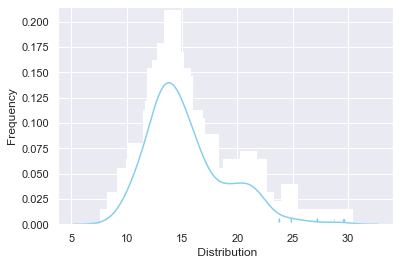

In [128]:
# Normal Distribution
ax = sns.distplot(df['radius'],
                  bins=100,
                  kde=True,
                  color='skyblue',
                  hist_kws={"linewidth": 15,'alpha':1})
ax.set(xlabel=' Distribution', ylabel='Frequency')

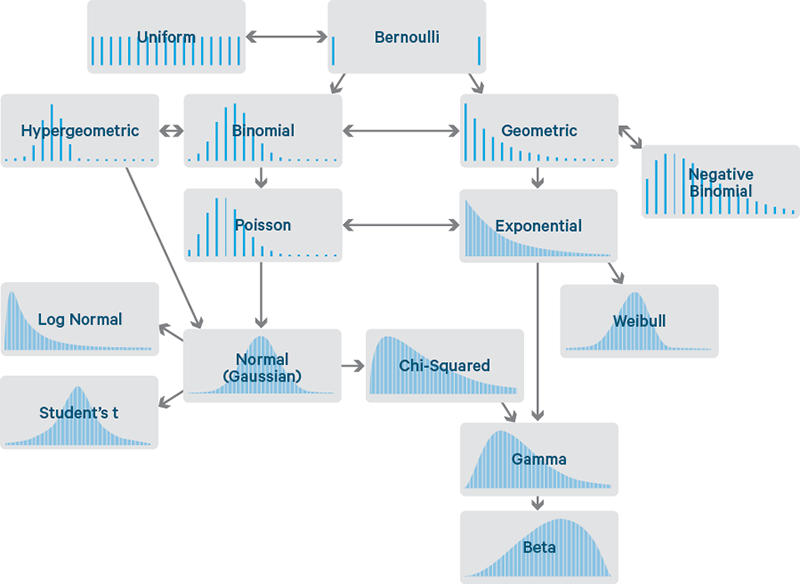

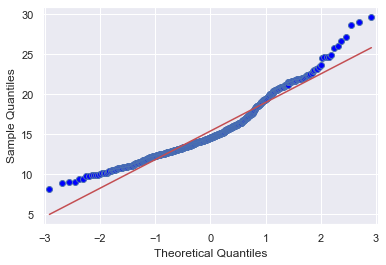

In [129]:
from statsmodels.graphics.gofplots import qqplot

# q-q plot
qqplot(df['radius'], line='s')
plt.show()

The QQ plot showing the scatter plot of points in a diagonal line, Not fitting the expected diagonal pattern for a sample from a Gaussian distribution.

In [130]:
# Performing the Shapiro-Wilk test to check normality 
stat, p = shapiro(df['radius'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.939, p=0.000
Sample does not look Gaussian (reject H0)


[Text(0.5, 0, 'Gamma Distribution'), Text(0, 0.5, 'Frequency')]

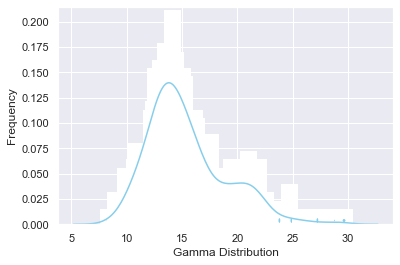

In [131]:
#Gamma Distribution
ax = sns.distplot(df['radius'],
                  kde=True,
                  bins=100,
                  color='skyblue',
                  hist_kws={"linewidth": 15,'alpha':1})
ax.set(xlabel='Gamma Distribution', ylabel='Frequency')

In [132]:
from distfit import distfit


[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [RSS: 0.0343779] [loc=15.403 scale=3.568]
[distfit] >[expon     ] [0.00 sec] [RSS: 0.1215392] [loc=8.201 scale=7.202]
[distfit] >[pareto    ] [0.03 sec] [RSS: 0.1824586] [loc=-0.014 scale=8.215]
[distfit] >[dweibull  ] [0.01 sec] [RSS: 0.0207798] [loc=14.765 scale=2.812]
[distfit] >[t         ] [0.04 sec] [RSS: 0.0269702] [loc=15.057 scale=3.068]
[distfit] >[genextreme] [0.04 sec] [RSS: 0.0120043] [loc=13.774 scale=2.764]
[distfit] >[gamma     ] [0.00 sec] [RSS: 0.0151390] [loc=7.456 scale=1.552]
[distfit] >[lognorm   ] [0.03 sec] [RSS: 0.0130124] [loc=5.434 scale=9.381]
[distfit] >[beta      ] [0.07 sec] [RSS: 0.0151531] [loc=7.458 scale=17555.260]
[distfit] >[uniform   ] [0.0 sec] [RSS: 0.1166051] [loc=8.201 scale=21.484]
[distfit] >[loggamma  ] [0.04 sec] [RSS: 0.0353816] [loc=-1052.631 scale=144.617]
[distfit] >Compute confidence interval [parametric]
[distfit] >plot..


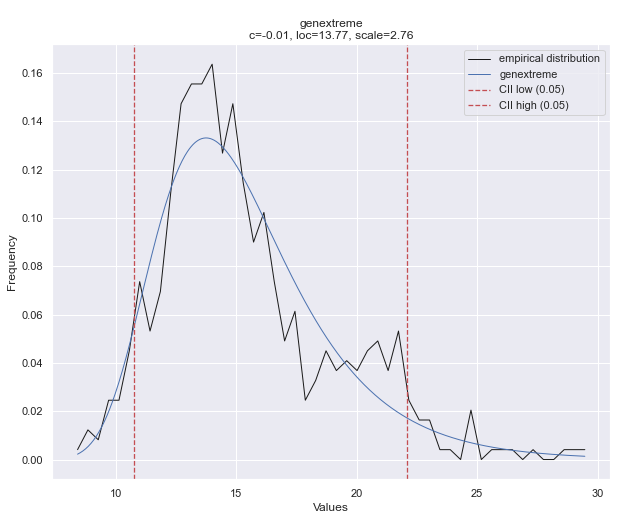

(<Figure size 720x576 with 1 Axes>,
 <AxesSubplot:title={'center':'\ngenextreme\nc=-0.01, loc=13.77, scale=2.76'}, xlabel='Values', ylabel='Frequency'>)

In [133]:
dist = distfit(todf=True)
dist.fit_transform(df['radius'])
dist.plot()

## Descriptive Statistics for Categorical Variable

In [134]:
print(df.describe(include='object'))

       Diagnosis
count        569
unique         2
top            B
freq         357


In [135]:
# Our last column is just an error in the data reading. Dropping it
df = df.drop(['ID_number',], axis=1)

In [136]:
# Creating a binary target column to allow some data manipulations later on
df['Target'] = df['Diagnosis'].map({'B':0, 'M':1})

# Getting lists with features. This will be useful on visualization
mean_f = np.concatenate([['Diagnosis'], df.iloc[:,1:11].columns.tolist()])
error_f = np.concatenate([['Diagnosis'], df.iloc[:,11:21].columns.tolist()])
worst_f = np.concatenate([['Diagnosis'], df.iloc[:,21:31].columns.tolist()])

# Defining Train/Test sets

In [38]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2,stratify=df['Target'], random_state=42) 

In [39]:
train_diag = train.Diagnosis.value_counts() / train.shape[0]
train_diag.rename('Train', inplace=True)
test_diag = test.Diagnosis.value_counts() / test.shape[0]
test_diag.rename('Test', inplace=True)

pd.concat([train_diag, test_diag], axis=1)

,Train,Test
B,0.63,0.63
M,0.37,0.37


# Data Exploration
## we will look at individual features and combinations of features

## Distribution for Target Variable

B    285
M    170
Name: Diagnosis, dtype: int64


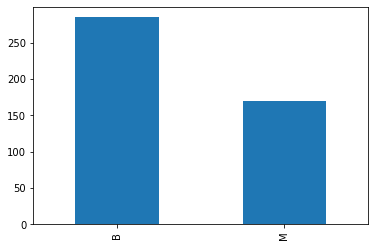

In [40]:
train['Diagnosis'].value_counts().plot(kind='bar')
print(train['Diagnosis'].value_counts())

In [41]:
train.iloc[:,51:61]

,radius,texture,perimeter,area,smoothness,compactness,concavity,concave_points,symmetry,fractal_dimension
10,17.31,24.68,104.25,799.85,0.90,0.95,0.94,0.90,1.08,0.85
170,13.55,13.75,80.34,465.99,0.98,0.98,0.98,0.95,1.15,0.83
407,14.17,22.87,84.19,516.56,0.93,1.12,1.12,0.94,1.14,0.93
430,16.14,23.93,103.71,686.95,0.96,1.30,1.37,1.07,1.14,0.92
27,20.01,21.76,123.78,1096.23,1.00,1.10,1.20,1.03,1.14,0.88
212,29.69,19.94,190.43,2501.65,1.04,1.14,1.40,1.08,1.21,0.88
84,13.22,17.10,78.42,445.17,0.95,1.02,1.00,0.88,1.17,0.84
36,15.50,23.14,95.19,634.95,0.95,1.11,1.18,0.96,1.15,0.88
171,14.74,21.07,87.43,567.47,0.94,0.96,1.02,0.92,1.09,0.81
237,21.85,22.88,134.17,1308.21,0.96,1.09,1.12,1.00,1.07,0.87


We are dealing with three measures: mean, std. error and the 'worst'. We should look at each separatedly.

We can plot the distribution and look for skewness on the mean values but there is not much we can obtain from plotting distributions of the other two:

Std. error is already a parameter obtained from a distribution and only have positive values so it's likely that we find it to be right-skewed.
Worst is a biased subsample of the measure's samples

The Central Limit Theroem states that the distribution of the mean values should look like a normal distribution. Let's explore that.

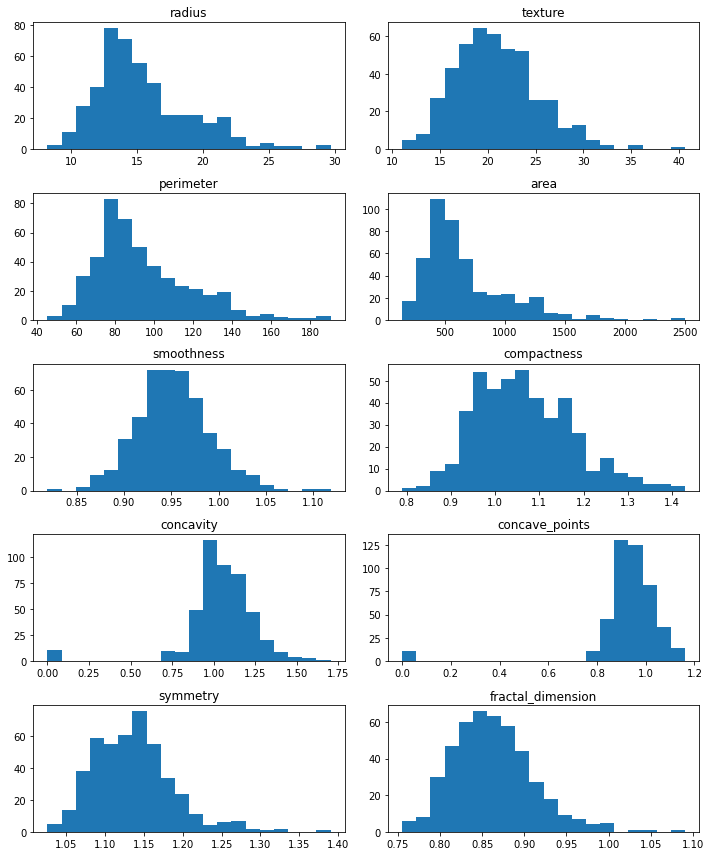

In [42]:
train.iloc[:,51:61].hist(figsize=(10,12), bins=20, layout=(5,2), grid=False)
plt.tight_layout();

We can see that some features are pretty skewed. We can measure its skewness using pandas skew method and we can try comparing it to a log transformation of the same values to see if we can reduce the skewness.

In [43]:
log_means = np.log1p(train.iloc[:,51:61])

skewness = pd.DataFrame({'Original Skewness':train.iloc[:,51:61].skew(),
                         'Log Transformed':log_means.skew()})
skewness['Skewness Reduction'] = skewness['Original Skewness'] - skewness['Log Transformed']
skewness

,Original Skewness,Log Transformed,Skewness Reduction
radius,1.00,0.43,0.57
texture,0.64,0.03,0.61
perimeter,1.04,0.36,0.68
area,1.72,0.31,1.41
smoothness,0.38,0.30,0.08
compactness,0.55,0.41,0.14
concavity,-2.22,-3.58,1.36
concave_points,-4.28,-5.06,0.78
symmetry,0.92,0.81,0.10
fractal_dimension,0.77,0.67,0.10


We managed to greatly reduce skewness on Perimeter,smoothness,compactness ,concavity ,concave_points ,symmetry and fractal_dimension. The other features were barely influenced by our log transformation.

Let's explore how are the standard errors for each measure!

In [44]:
measure_index = ['radius', 'texture', 'perimeter', 'area',
                'smoothness', 'compactness', 'concavity',
                'concave points', 'symmetry', 'fractal_dimension']

measure_data = np.c_[train.iloc[:,51:61].mean().values, train.iloc[:,11:21].mean().values]

measure_df = pd.DataFrame(data=measure_data, columns=['Mean', 'Error'], index=measure_index)

measure_df['Error pct'] = 100 * measure_df['Error'] / measure_df['Mean']

measure_df

,Mean,Error,Error pct
radius,15.44,4.11e-01,2.66
texture,20.85,1.22e+00,5.84
perimeter,93.77,2.91e+00,3.11
area,661.57,4.13e+01,6.24
smoothness,0.95,6.90e-03,0.72
compactness,1.07,2.53e-02,2.37
concavity,1.05,3.20e-02,3.06
concave points,0.93,1.17e-02,1.26
symmetry,1.14,2.04e-02,1.80
fractal_dimension,0.86,3.77e-03,0.44


This might explain part of our high skewness: from our four highly skewed features, three of them have standard errors of more than 20%!

Many things can cause that (e.g. uncallibrated measuring instruments).

## Mean Features Plot
There are a few things to point out on this plot.

From all the histograms in the grid's diagonal plots, only fractal dimension has no visual impact on the tumor's class. That is also observed in all plots on the last row/column. This is convenient because Fractal Dimension is the unexplained skewed feature we've just talked about. This is a strong candidate for a feature selection later on.
The second lowest visual impact (I'm saying visual because we will see some numbers later) is on symmetry.
All the other features appear to have a significant impact on the classification of tumors and the scatterplots look quite 'separable'.
We also can observe some 'pretty plots' on the related geometrical features Radius, Area and Perimeter, which is to be expected. This high correlation between features might be a problem for some ML algorithms

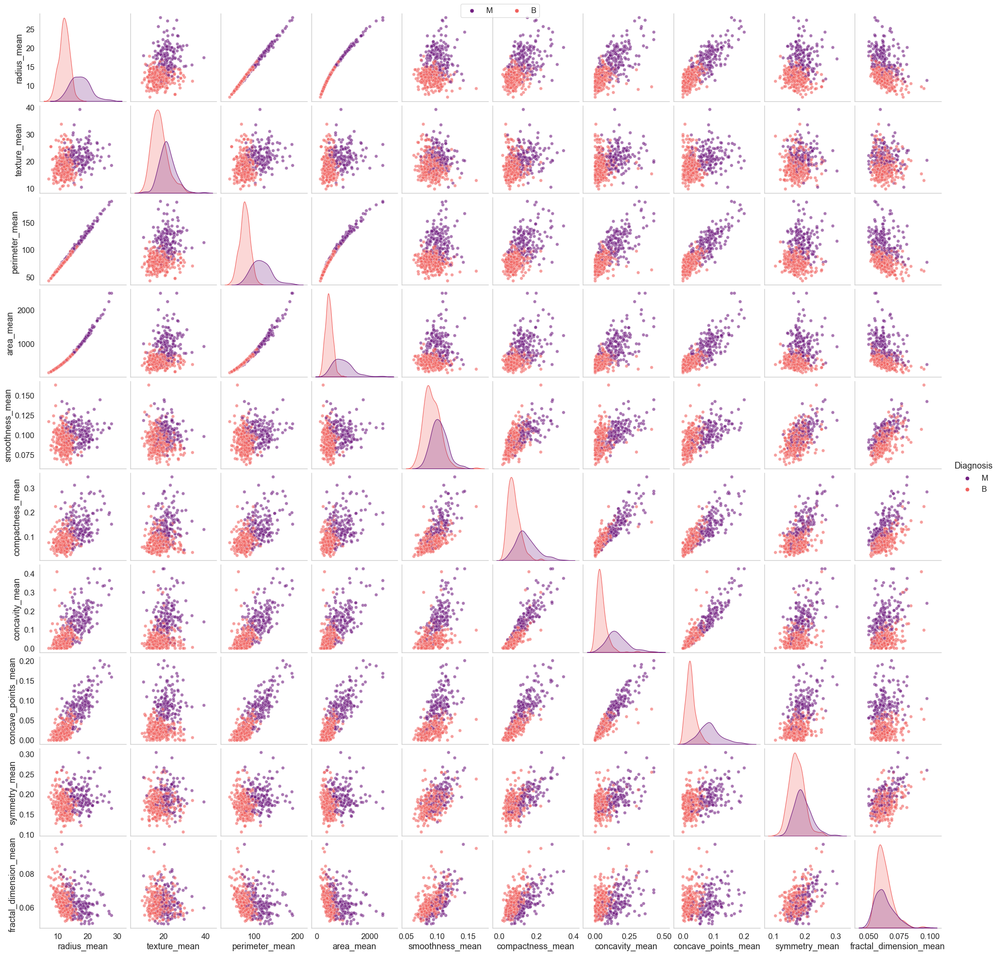

In [45]:
sns.set(style='whitegrid', font_scale=1.35, rc={'axes.grid': False})
p = sns.pairplot(train[mean_f], hue='Diagnosis',
             plot_kws={'alpha':0.6}, palette='magma')

plt.subplots_adjust(hspace=0.05, wspace=0.05)
handles = p._legend_data.values()
labels = p._legend_data.keys()
p.fig.legend(handles=handles, labels=labels, loc='upper center', ncol=2)
p.fig.set_dpi(80);

## Error Features Plot
This one surprised me at first.

I didn't expect to find anything here - and most features' errors don't appear to have an impact - but look at Area, Perimeter, Radius and Compactness. The data suggests the higher the error on these features, the higher the chance of having a malignant tumor. How can we interpret that?

Let's remember how Standard error is calculated: by dividing the standard deviation by the squareroot of the sample size.

SE = σ / √n
 
I will assume that the sample sizes do not change for each tumor sample, so the Standard error's variation is due to the Standard Deviation only.

Assuming that is the case, we can interpret that the malignant tumors have higher irregularity on their geometry, which causes the higher standard deviation!

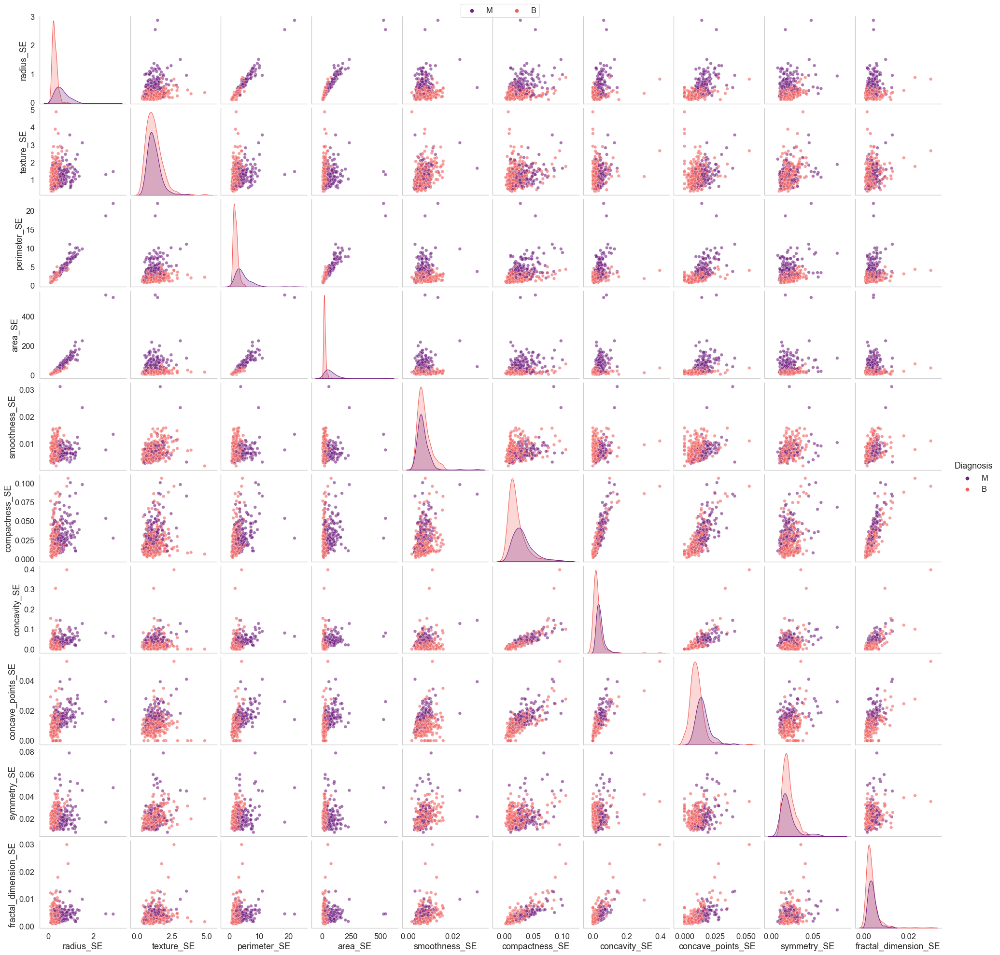

In [46]:
p = sns.pairplot(train[error_f], hue='Diagnosis',
             plot_kws={'alpha':0.6, }, palette='magma')

plt.subplots_adjust(hspace=0.05, wspace=0.05)
handles = p._legend_data.values()
labels = p._legend_data.keys()
p.fig.legend(handles=handles, labels=labels, loc='upper center', ncol=2)
p.fig.set_dpi(80);

## Worst Features Plot
These plots look very similar to the previous one. This is to be expected since the worst features are subsamples of the mean data.

It is hard to tell which one is more important for a predicting model only by looking at those visuals. We need to get some numbers to see if there is a significant difference.

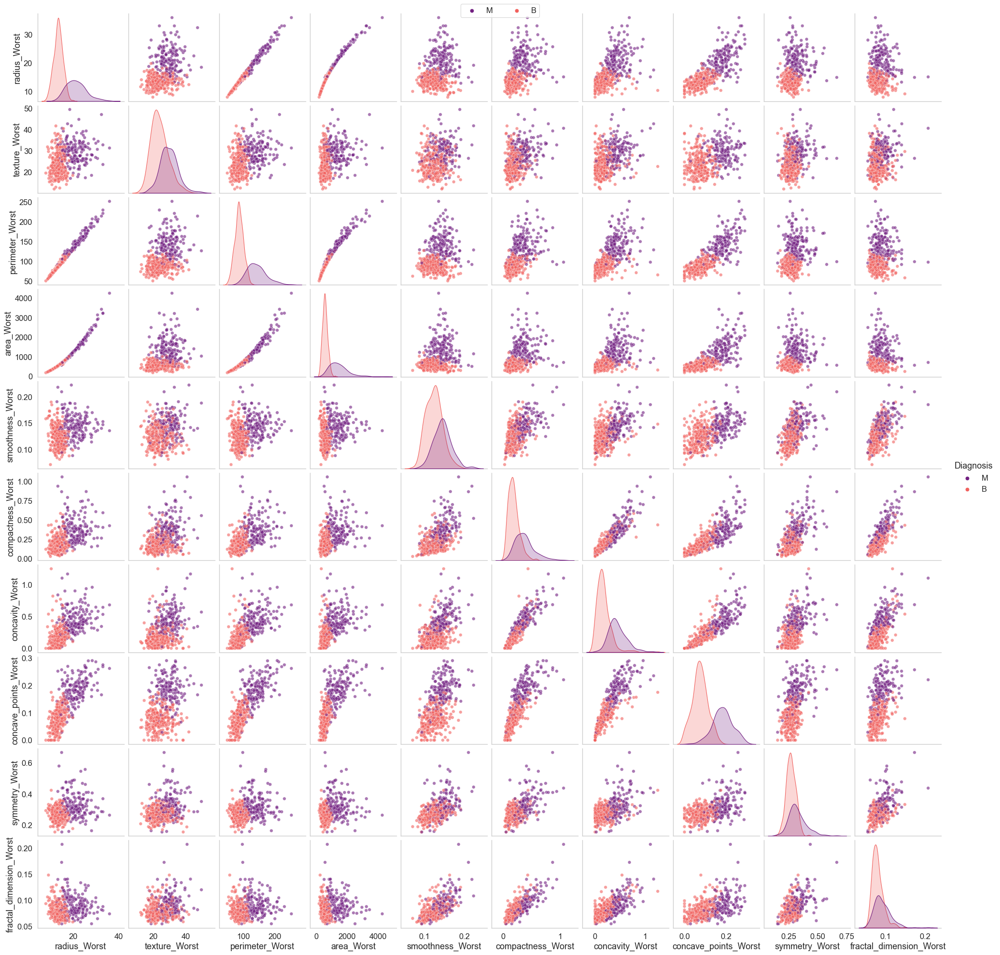

In [47]:
p = sns.pairplot(train[worst_f], hue='Diagnosis',
                 plot_kws={'alpha':0.6}, palette='magma')

plt.subplots_adjust(hspace=0.05, wspace=0.05)
handles = p._legend_data.values()
labels = p._legend_data.keys()
p.fig.legend(handles=handles, labels=labels, loc='upper center', ncol=2)
p.fig.set_dpi(80);

# Correlations
To calculate the correlations we can use the pandas corr method.

To visualize it better we can use the classic seaborn's heatmap - which is perfectly fine - but I will plot it using horizontal bar charts.

The downside of not plotting a heatmap is that we do not see how features are correlated to each other: there might be redundant features we don't need to feed a machine learning model. We can already see highly correlated features from our previous plots (e.g. Perimeter and Area), but I've chosen to keep them all and let the algorithms decide for them selves which ones are important and which ones aren't (feature selection and regularization).

## Correlation by Feature Type
First, lets see if we can find a predominant type of feature (worst, mean or se). Did we visualize it correctly in the previous plots?

In [48]:
# Save labels in y
y = train["Diagnosis"]
# Drop columns
X = train.drop([ "Diagnosis"], axis=1)

<AxesSubplot:>

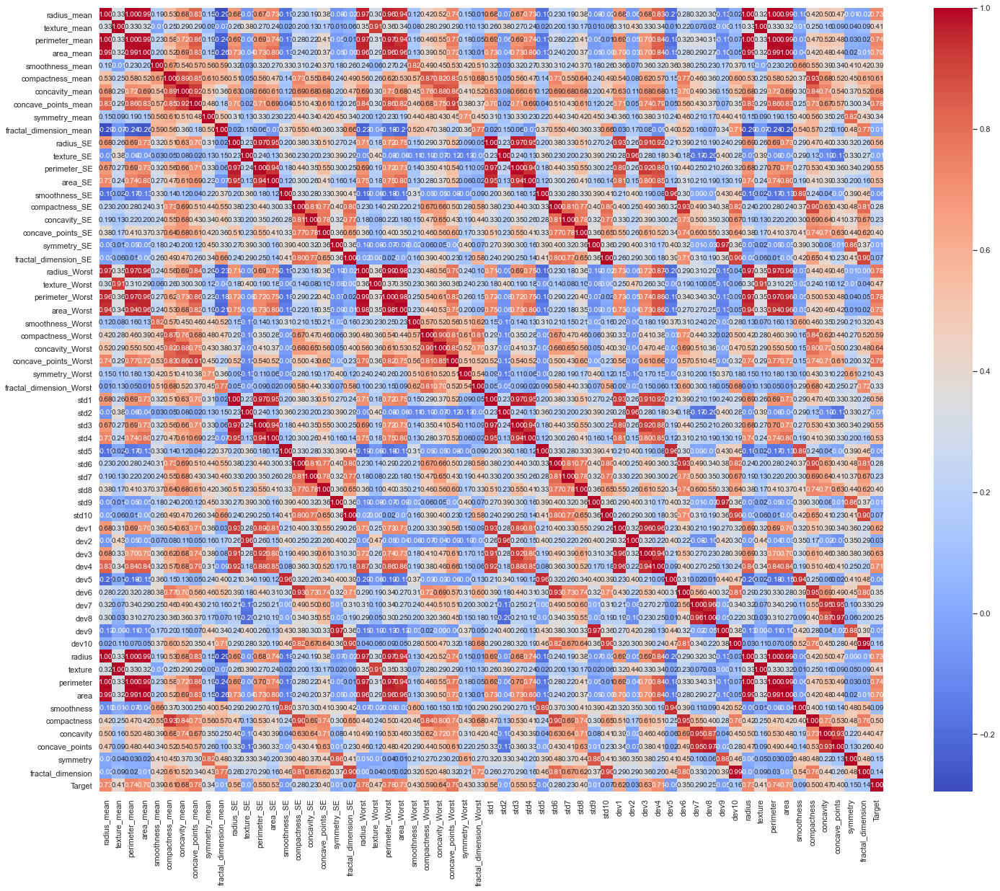

In [49]:
# Plot a Correlation chart
corr = X.corr() # .corr is used for find corelation
#plt.figure(figsize=(20,15))
sns.set(rc={'figure.figsize':(25,20)})
# plot a heatmap
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 10},
           xticklabels= X.columns, yticklabels= X.columns,
           cmap= 'coolwarm') 

*There is some stronge correlations: *
Features like (something)_mean, (something)_se, (something)_worst, have a natural correlation because all these are generated using same data, for example: to generate radius_mean, radius_se and radius_worst, radius mesuraments is used.

### Positive Correlation:
Radius, Perimeter and Area have stronge positive correlation

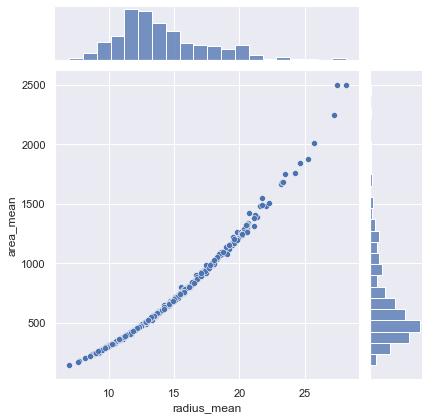

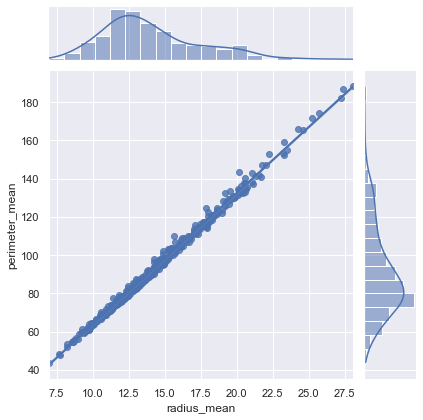

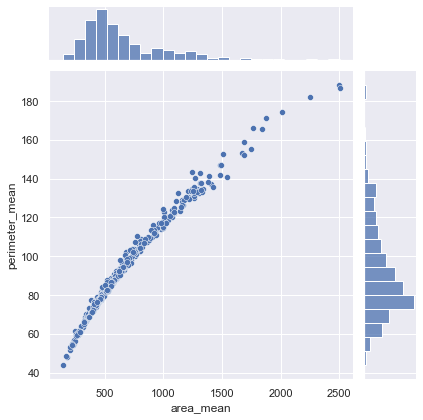

In [50]:
# Plot correlation between 2 features and distribution
sns.jointplot(X.loc[:,'radius_mean'], 
              X.loc[:,'area_mean'], 
              kind="scatter")

sns.jointplot(X.loc[:,'radius_mean'], 
              X.loc[:,'perimeter_mean'], 
              kind="reg")

sns.jointplot(X.loc[:,'area_mean'], 
              X.loc[:,'perimeter_mean'], 
              kind="scatter")

### Radius have a strong positive correlation with Concave Points

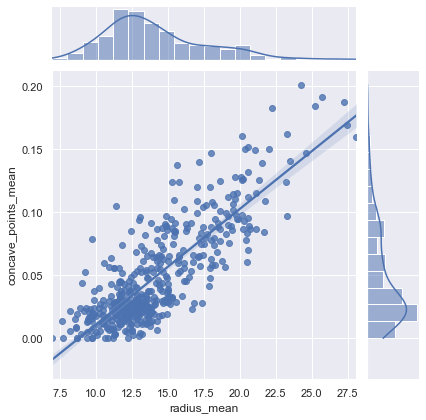

In [51]:
# Plot correlation between 2 features and distribution
sns.jointplot(X.loc[:,'radius_mean'], 
              X.loc[:,'concave_points_mean'], 
              kind="reg")

### Compacteness, Concavity and Concave Points have strong positive correlation

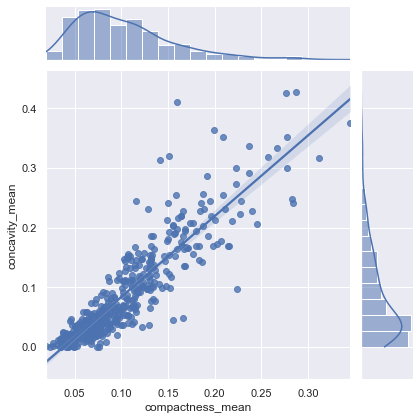

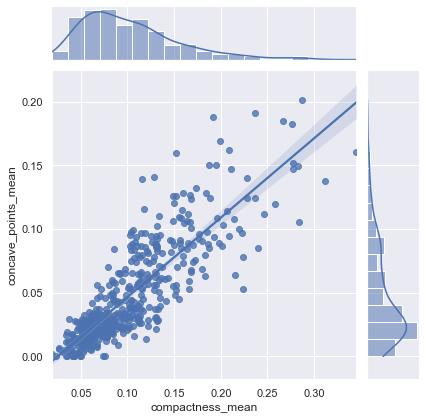

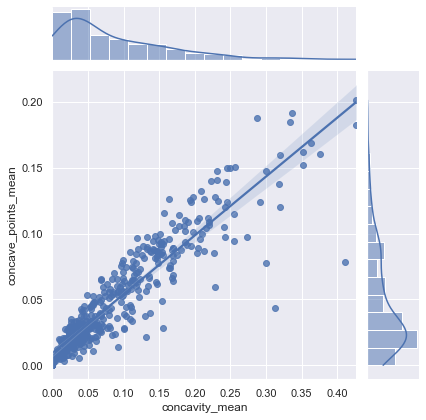

In [52]:
# Plot correlation between 2 features and distribution
sns.jointplot(X.loc[:,'compactness_mean'], 
              X.loc[:,'concavity_mean'], 
              kind="reg")

sns.jointplot(X.loc[:,'compactness_mean'], 
              X.loc[:,'concave_points_mean'], 
              kind="reg")


sns.jointplot(X.loc[:,'concavity_mean'], 
              X.loc[:,'concave_points_mean'], 
              kind="reg")

### Negative Correlation
Fractal Dimention have some negative correlation with Radius, Perimeter and Area

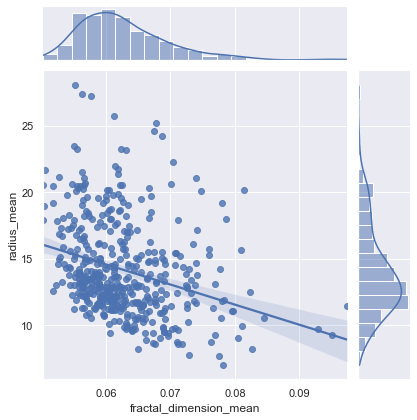

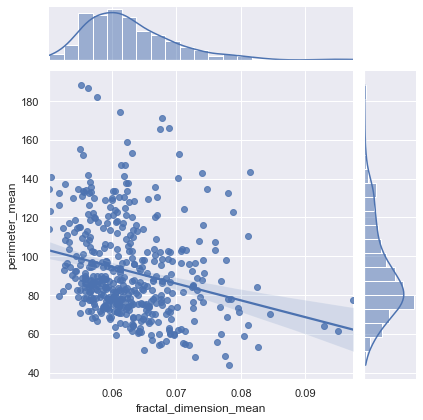

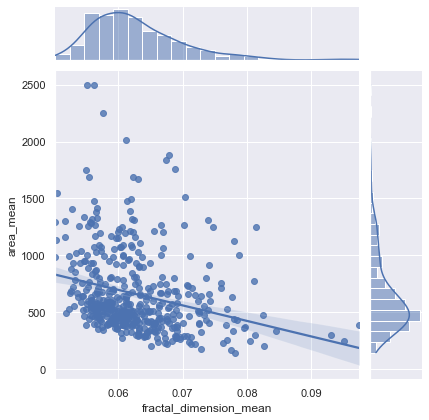

In [53]:
# Plot correlation between 2 features and distribution
sns.jointplot(X.loc[:,'fractal_dimension_mean'], 
              X.loc[:,'radius_mean'], 
              kind="reg")

sns.jointplot(X.loc[:,'fractal_dimension_mean'], 
              X.loc[:,'perimeter_mean'], 
              kind="reg")

sns.jointplot(X.loc[:,'fractal_dimension_mean'], 
              X.loc[:,'area_mean'], 
              kind="reg")

Insights from the plot:

We can observe that for all features except for Fractal Dimension have a similar pattern: The two highest correlated feature types are WORST and MEAN and the lowest is the STANDARD ERROR.
Fractal dimension has been the exception since 3.1. Apparently all that matters in terms of this feature are the worst measures.
That said, we must remember that Pearson's correlation can only measure two individual features and we can't see how the combination of features influence in our target. As I've mentioned: I will keep them and let my model decide.

# Feature engineering

## We are Creating a Volume Mean Feature using radius_mean

In [54]:
X.info

<bound method DataFrame.info of      radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
10         16.02         23.24          102.70      797.8             0.08   
170        12.32         12.39           78.85      464.1             0.10   
407        12.85         21.37           82.63      514.5             0.08   
430        14.90         22.53          102.10      685.0             0.10   
27         18.61         20.25          122.10     1094.0             0.09   
212        28.11         18.47          188.50     2499.0             0.11   
84         12.00         15.65           76.95      443.3             0.10   
36         14.25         21.72           93.63      633.0             0.10   
171        13.43         19.63           85.84      565.4             0.09   
237        20.48         21.46          132.50     1306.0             0.08   
353        15.08         25.74           98.00      716.6             0.10   
180        27.22         21.87  

In [55]:
# defining pi
import math
mean_volume = []
pi = 3.1415
mean_volume = pd.DataFrame(map(lambda x: ((4/3)*pi*pow(x,3)),X['radius_mean']))

In [56]:

# Creating a new feature
X["mean_volume"]= pd.DataFrame(mean_volume)

In [57]:
# Creating a new feature adding up some phisical measuraments
X["mesuraments_sum_mean"] = X["radius_mean"] + X["perimeter_mean"] + X["area_mean"]

In [58]:
X.head(10)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,...,area,smoothness,compactness,concavity,concave_points,symmetry,fractal_dimension,Target,mean_volume,mesuraments_sum_mean
10,16.02,23.24,102.70,797.8,0.08,0.07,0.03,0.03,0.15,0.06,...,799.85,0.90,0.95,0.94,0.90,1.08,0.85,1,14364.15,916.52
170,12.32,12.39,78.85,464.1,0.10,0.07,0.04,0.04,0.20,0.06,...,465.99,0.98,0.98,0.98,0.95,1.15,0.83,0,41978.03,555.27
407,12.85,21.37,82.63,514.5,0.08,0.08,0.06,0.02,0.16,0.06,...,516.56,0.93,1.12,1.12,0.94,1.14,0.93,0,12611.81,609.98
430,14.90,22.53,102.10,685.0,0.10,0.22,0.27,0.10,0.20,0.07,...,686.95,0.96,1.30,1.37,1.07,1.14,0.92,1,1905.57,802.00
27,18.61,20.25,122.10,1094.0,0.09,0.11,0.15,0.08,0.17,0.06,...,1096.23,1.00,1.10,1.20,1.03,1.14,0.88,1,4862.77,1234.71
212,28.11,18.47,188.50,2499.0,0.11,0.15,0.32,0.16,0.16,0.06,...,2501.65,1.04,1.14,1.40,1.08,1.21,0.88,1,13523.81,2715.61
84,12.00,15.65,76.95,443.3,0.10,0.07,0.04,0.02,0.21,0.06,...,445.17,0.95,1.02,1.00,0.88,1.17,0.84,0,9787.88,532.25
36,14.25,21.72,93.63,633.0,0.10,0.11,0.13,0.06,0.19,0.06,...,634.95,0.95,1.11,1.18,0.96,1.15,0.88,1,14108.50,740.88
171,13.43,19.63,85.84,565.4,0.09,0.06,0.06,0.03,0.16,0.06,...,567.47,0.94,0.96,1.02,0.92,1.09,0.81,1,5995.81,664.67
237,20.48,21.46,132.50,1306.0,0.08,0.08,0.09,0.06,0.15,0.05,...,1308.21,0.96,1.09,1.12,1.00,1.07,0.87,1,6952.34,1458.98


## Feature Scaling

Since the range of values of raw data varies widely, in some machine learning algorithms, objective functions will not work properly without normalization. For example, the majority of classifiers calculate the distance between two points by the Euclidean distance. If one of the features has a broad range of values, the distance will be governed by this particular feature. Therefore, the range of all features should be normalized so that each feature contributes approximately proportionately to the final distance.

In [59]:
# Define a scaler function
def scaler(df):
    """The Function receive a Dataframe and return a Scaled Dataframe"""
    scaler = preprocessing.MinMaxScaler()
    scaled_df = scaler.fit_transform(df)
    scaled_df = pd.DataFrame(scaled_df, columns=df.columns)
    
    return scaled_df

# testing scaler
scaled_df = scaler(X)

scaled_df.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,...,area,smoothness,compactness,concavity,concave_points,symmetry,fractal_dimension,Target,mean_volume,mesuraments_sum_mean
0,0.43,0.46,0.41,0.28,0.19,0.15,0.08,0.17,0.24,0.14,...,0.28,0.27,0.26,0.55,0.78,0.15,0.29,1.0,0.15,0.29
1,0.25,0.09,0.24,0.14,0.40,0.15,0.09,0.18,0.45,0.20,...,0.14,0.53,0.30,0.58,0.82,0.34,0.22,0.0,0.47,0.14
2,0.28,0.39,0.27,0.16,0.13,0.20,0.14,0.09,0.26,0.23,...,0.16,0.36,0.52,0.66,0.81,0.33,0.53,0.0,0.13,0.16
3,0.37,0.43,0.40,0.23,0.37,0.62,0.64,0.48,0.50,0.40,...,0.23,0.48,0.79,0.81,0.92,0.30,0.48,1.0,0.00,0.24
4,0.55,0.36,0.54,0.40,0.32,0.27,0.35,0.38,0.32,0.14,...,0.40,0.59,0.48,0.71,0.89,0.32,0.36,1.0,0.04,0.41


## Features Distribution

<AxesSubplot:xlabel='value', ylabel='features'>

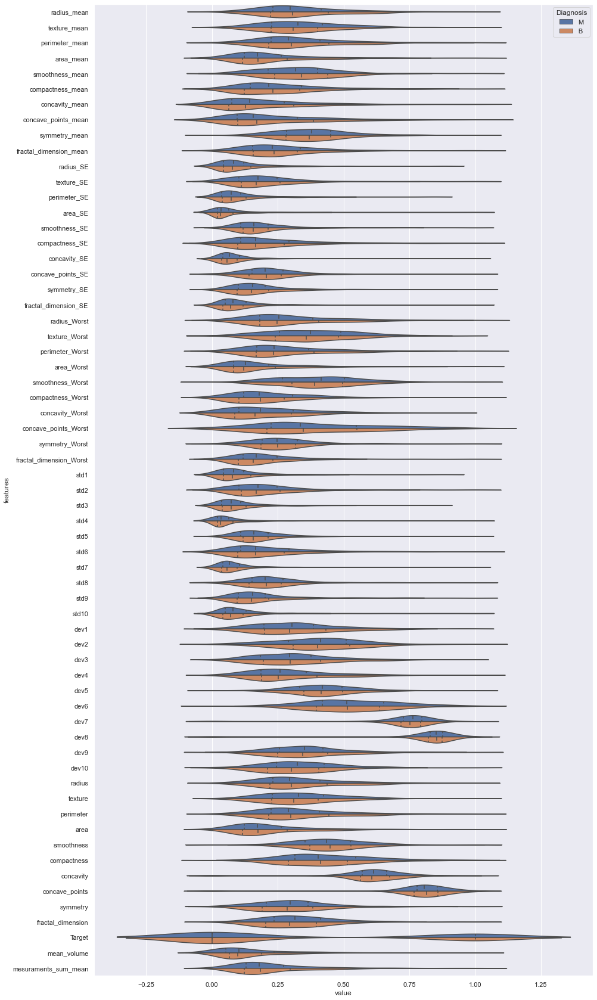

In [60]:
# Preparing data
data_plot = pd.concat([y,scaled_df],axis=1)
data_plot = pd.melt(data_plot,id_vars="Diagnosis",
                    var_name="features",
                    value_name='value')
# Plot a violinplot
sns.set(rc={'figure.figsize':(15,30)})
sns.violinplot(x="value", y="features", hue="Diagnosis", data=data_plot,split=True, inner="quart")

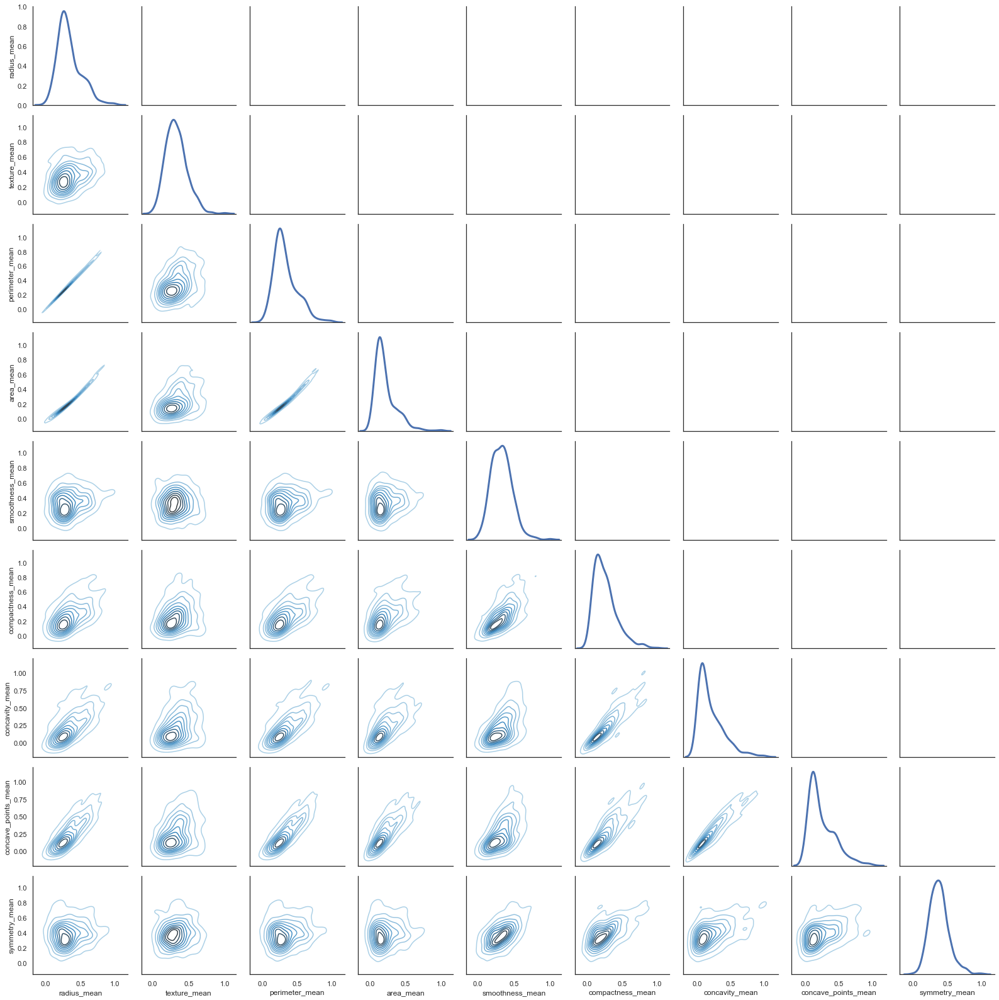

In [61]:
# Ploting a pairplot Grid
sns.set(style="white")
df = scaled_df.iloc[:,0:9]
g = sns.PairGrid(df, diag_sharey=False)
g.map_lower(sns.kdeplot, cmap="Blues_d")
g.map_upper(plt.scatter)
g.map_diag(sns.kdeplot, lw=3)

<AxesSubplot:xlabel='value', ylabel='features'>

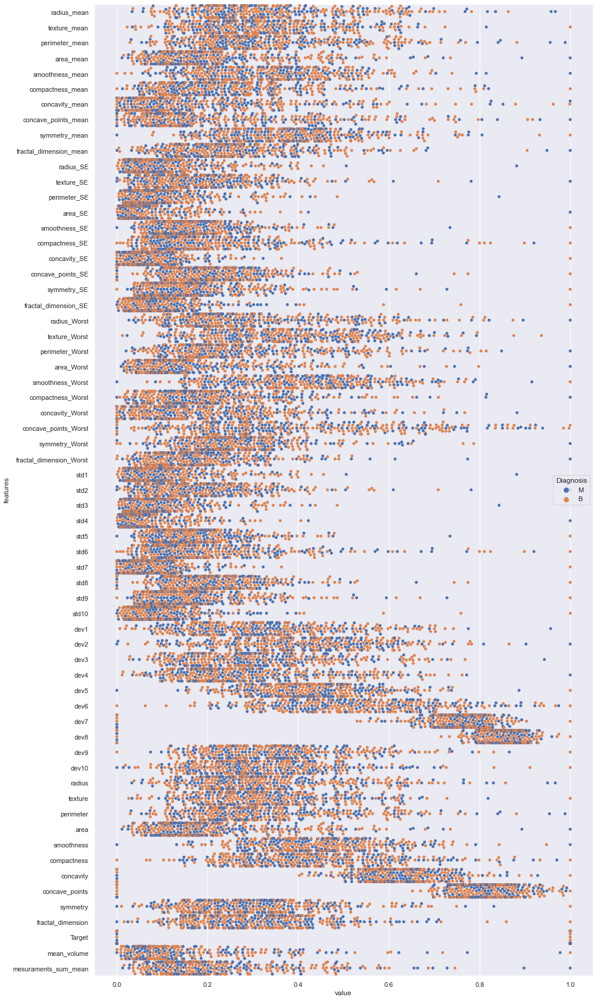

In [62]:
# Plot a Swarmplot
sns.set(style="whitegrid", palette="muted")
data_plot = scaled_df
data_plot = pd.concat([y,data_plot.iloc[:,0:]],axis=1)
data_plot = pd.melt(data_plot,id_vars="Diagnosis",
                    var_name="features",
                    value_name='value')
#plt.figure(figsize=(10,10))
sns.set(rc={'figure.figsize':(15,30)})
sns.swarmplot(x="value", y="features", hue="Diagnosis", data=data_plot)

# Model development

In [143]:
X = df.drop(['Diagnosis','Target',], axis=1)

In [144]:
X = df[cols]
y = df["Target"]

In [145]:
y

0      1
1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     0
20     0
21     0
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
31     1
32     1
33     1
34     1
35     1
36     1
37     0
38     1
39     1
40     1
41     1
42     1
43     1
44     1
45     1
46     0
47     1
48     0
49     0
50     0
51     0
52     0
53     1
54     1
55     0
56     1
57     1
58     0
59     0
60     0
61     0
62     1
63     0
64     1
65     1
66     0
67     0
68     0
69     0
70     1
71     0
72     1
73     1
74     0
75     1
76     0
77     1
78     1
79     0
80     0
81     0
82     1
83     1
84     0
85     1
86     1
87     1
88     0
89     0
90     0
91     1
92     0
93     0
94     1
95     1
96     0
97     0
98     0
99     1
100    1
101    0
102    0
103    0
104    0
105    1
106    0
107    0
108    1
109    0
110    0
1

In [ ]:
#Splitting the Data for training and testing

In [147]:
X_train, X_test, y_train, y_test = train_test_split(X.values, y, test_size = 0.2, random_state = 0)
print(f"Train Data: {X_train.shape}, {y_train.shape}")
print(f"Train Data: {X_test.shape}, {y_test.shape}")

Train Data: (455, 9), (455,)
Train Data: (114, 9), (114,)


In [150]:
# Upsampling using SMOTE
counter = Counter(y_train)
counter

Counter({0: 290, 1: 165})

In [151]:
upsample = SMOTE()
X_train, y_train = upsample.fit_resample(X_train, y_train)
counter = Counter(y_train)
print(counter)

Counter({0: 290, 1: 290})


In [152]:
print(f"Total Data after Upsampling: {len(X_train)}")


Total Data after Upsampling: 580


In [153]:
print(f"Train Data: {X_train.shape}, {y_train.shape}")
print(f"Test Data: {X_test.shape}, {y_test.shape}")

Train Data: (580, 9), (580,)
Test Data: (114, 9), (114,)


In [154]:
accuracy_all = []
cvs_all = []

In [155]:
from sklearn.linear_model import SGDClassifier

start = time.time()

clf = SGDClassifier()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("SGD Classifier Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: {0:.5} seconds \n".format(end-start))

SGD Classifier Accuracy: 77.19%
Cross validation score: 85.07% (+/- 7.65%)
Execution time: 0.030997 seconds 



In [156]:
from sklearn.svm import SVC, NuSVC, LinearSVC

start = time.time()

clf = SVC()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("SVC Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: {0:.5} seconds \n".format(end-start))

start = time.time()

clf = NuSVC()
clf.fit(X_train, y_train)
prediciton = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("NuSVC Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: {0:.5} seconds \n".format(end-start))

start = time.time()

clf = LinearSVC()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("LinearSVC Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: {0:.5} seconds \n".format(end-start))

SVC Accuracy: 89.47%
Cross validation score: 88.76% (+/- 9.22%)
Execution time: 0.052999 seconds 

NuSVC Accuracy: 89.47%
Cross validation score: 85.24% (+/- 9.47%)
Execution time: 0.068002 seconds 

LinearSVC Accuracy: 80.70%
Cross validation score: 84.37% (+/- 14.20%)
Execution time: 0.081005 seconds 



In [157]:
from sklearn.neighbors import KNeighborsClassifier

start = time.time()

clf = KNeighborsClassifier()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: {0:.5} seconds \n".format(end-start))

Accuracy: 90.35%
Cross validation score: 88.58% (+/- 7.10%)
Execution time: 0.037002 seconds 



In [158]:
from sklearn.naive_bayes import GaussianNB

start = time.time()

clf = GaussianNB()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: {0:.5} seconds \n".format(end-start))

Accuracy: 88.60%
Cross validation score: 91.39% (+/- 5.13%)
Execution time: 0.021 seconds 



In [159]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier

start = time.time()

clf = RandomForestClassifier()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("Random Forest Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: {0:.5} seconds \n".format(end-start))

start = time.time()

clf = ExtraTreesClassifier()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("Extra Trees Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: {0:.5} seconds \n".format(end-start))

start = time.time()

clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("Dedicion Tree Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: {0:.5} seconds \n".format(end-start))

Random Forest Accuracy: 95.61%
Cross validation score: 94.20% (+/- 6.52%)
Execution time: 0.68659 seconds 

Extra Trees Accuracy: 92.11%
Cross validation score: 94.03% (+/- 5.90%)
Execution time: 0.49 seconds 

Dedicion Tree Accuracy: 92.98%
Cross validation score: 91.39% (+/- 3.39%)
Execution time: 0.019977 seconds 



In [160]:
accuracy_selection = []
cvs_selection = []

In [161]:
#Stochastic Gradient Descent
from sklearn.linear_model import SGDClassifier

start = time.time()

clf = SGDClassifier()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_selection.append(accuracy_score(prediction, y_test))
cvs_selection.append(np.mean(scores))

print("SGD Classifier Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

SGD Classifier Accuracy: 69.30%
Cross validation score: 84.01% (+/- 13.00%)
Execution time: 0.024 seconds 



In [162]:
#Support Vector Machines
from sklearn.svm import SVC, NuSVC, LinearSVC

start = time.time()

clf = SVC()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_selection.append(accuracy_score(prediction, y_test))
cvs_selection.append(np.mean(scores))

print("SVC Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

start = time.time()

clf = NuSVC()
clf.fit(X_train, y_train)
prediciton = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_selection.append(accuracy_score(prediction, y_test))
cvs_selection.append(np.mean(scores))

print("NuSVC Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

start = time.time()

clf = LinearSVC()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_selection.append(accuracy_score(prediction, y_test))
cvs_selection.append(np.mean(scores))

print("LinearSVC Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

SVC Accuracy: 89.47%
Cross validation score: 88.76% (+/- 9.22%)
Execution time: 0.055001 seconds 

NuSVC Accuracy: 89.47%
Cross validation score: 85.24% (+/- 9.47%)
Execution time: 0.071001 seconds 

LinearSVC Accuracy: 83.33%
Cross validation score: 83.32% (+/- 8.39%)
Execution time: 0.079002 seconds 



In [163]:
#Nearest Neighbors
from sklearn.neighbors import KNeighborsClassifier

start = time.time()

clf = KNeighborsClassifier()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_selection.append(accuracy_score(prediction, y_test))
cvs_selection.append(np.mean(scores))

print("Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

Accuracy: 90.35%
Cross validation score: 88.58% (+/- 7.10%)
Execution time: 0.037002 seconds 



In [164]:
#Naive Bayes
from sklearn.naive_bayes import GaussianNB

start = time.time()

clf = GaussianNB()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_selection.append(accuracy_score(prediction, y_test))
cvs_selection.append(np.mean(scores))

print("Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

Accuracy: 88.60%
Cross validation score: 91.39% (+/- 5.13%)
Execution time: 0.018998 seconds 



In [165]:
#Forest and tree methods
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier

start = time.time()

clf = RandomForestClassifier()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_selection.append(accuracy_score(prediction, y_test))
cvs_selection.append(np.mean(scores))

print("Random Forest Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

start = time.time()

clf = ExtraTreesClassifier()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_selection.append(accuracy_score(prediction, y_test))
cvs_selection.append(np.mean(scores))

print("Extra Trees Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

start = time.time()

clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_selection.append(accuracy_score(prediction, y_test))
cvs_selection.append(np.mean(scores))

print("Dedicion Tree Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

Random Forest Accuracy: 95.61%
Cross validation score: 94.56% (+/- 5.36%)
Execution time: 0.679 seconds 

Extra Trees Accuracy: 93.86%
Cross validation score: 93.85% (+/- 3.67%)
Execution time: 0.48299 seconds 

Dedicion Tree Accuracy: 92.11%
Cross validation score: 92.09% (+/- 4.28%)
Execution time: 0.019978 seconds 



In [166]:
diff_accuracy = list(np.array(accuracy_selection) - np.array(accuracy_all))
diff_cvs = list(np.array(cvs_selection) - np.array(cvs_all))

d = {'accuracy_all':accuracy_all, 'accuracy_selection':accuracy_selection, 'diff_accuracy':diff_accuracy, 
     'cvs_all':cvs_all, 'cvs_selection':cvs_selection, 'diff_cvs':diff_cvs,}

index = ['SGD', 'SVC', 'NuSVC', 'LinearSVC', 'KNeighbors', 'GaussianNB', 'RandomForest', 'ExtraTrees', 'DecisionTree']

df1 = pd.DataFrame(d, index=index)

In [167]:
df1

,accuracy_all,accuracy_selection,diff_accuracy,cvs_all,cvs_selection,diff_cvs
SGD,0.77,0.69,-7.89e-02,0.85,0.84,-1.06e-02
SVC,0.89,0.89,0.00e+00,0.89,0.89,0.00e+00
NuSVC,0.89,0.89,0.00e+00,0.85,0.85,0.00e+00
LinearSVC,0.81,0.83,2.63e-02,0.84,0.83,-1.05e-02
KNeighbors,0.90,0.90,0.00e+00,0.89,0.89,0.00e+00
GaussianNB,0.89,0.89,0.00e+00,0.91,0.91,0.00e+00
RandomForest,0.96,0.96,0.00e+00,0.94,0.95,3.51e-03
ExtraTrees,0.92,0.94,1.75e-02,0.94,0.94,-1.77e-03
DecisionTree,0.93,0.92,-8.77e-03,0.91,0.92,7.05e-03


# Improving the best model

In [168]:
from sklearn.model_selection import GridSearchCV

accuracy_all = []
csv_all = []

In [169]:
start = time.time()

parameters = {'priors':[[0.01, 0.99],[0.1, 0.9], [0.2, 0.8], [0.25, 0.75], [0.3, 0.7],[0.35, 0.65], [0.4, 0.6]]}

clf = GridSearchCV(GaussianNB(), parameters, scoring = 'average_precision', n_jobs=-1)
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: {0:.5} seconds \n".format(end-start))

print("Best parameters: {0}".format(clf.best_params_))

Accuracy: 90.35%
Cross validation score: 95.44% (+/- 9.17%)
Execution time: 3.217 seconds 

Best parameters: {'priors': [0.01, 0.99]}


In [170]:
start = time.time()

parameters = {'n_estimators':list(range(1,101)), 'criterion':['gini', 'entropy']}

clf = GridSearchCV(RandomForestClassifier(), parameters, scoring = 'average_precision', n_jobs=-1)
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("Random Forest Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

print("Best parameters: {0} \n".format(clf.best_params_))

start = time.time()

clf = GridSearchCV(ExtraTreesClassifier(), parameters, scoring = 'average_precision', n_jobs=-1)
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("Extra Trees Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

print("Best parameters: {0} \n".format(clf.best_params_))

start = time.time()

parameters = {'criterion':['gini', 'entropy'], 'splitter':['best', 'random']}

clf = GridSearchCV(DecisionTreeClassifier(), parameters, scoring = 'average_precision', n_jobs=-1)
clf.fit(X_train, y_train)
prediction = clf.predict(X_test)
scores = cross_val_score(clf, X, y, cv=5)

end = time.time()

accuracy_all.append(accuracy_score(prediction, y_test))
cvs_all.append(np.mean(scores))

print("Dedicion Tree Accuracy: {0:.2%}".format(accuracy_score(prediction, y_test)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))
print("Execution time: %s seconds \n" % "{0:.5}".format(end-start))

print("Best parameters: {0} \n".format(clf.best_params_))

Random Forest Accuracy: 93.86%
Cross validation score: 97.49% (+/- 3.31%)
Execution time: 50.798 seconds 

Best parameters: {'criterion': 'entropy', 'n_estimators': 18} 

Extra Trees Accuracy: 93.86%
Cross validation score: 97.61% (+/- 2.78%)
Execution time: 39.041 seconds 

Best parameters: {'criterion': 'gini', 'n_estimators': 65} 

Dedicion Tree Accuracy: 92.98%
Cross validation score: 82.83% (+/- 13.96%)
Execution time: 0.24012 seconds 

Best parameters: {'criterion': 'gini', 'splitter': 'best'} 



In [171]:

    def footrule_aggregation(self,ranklist):
        """
        Computes aggregate rank by Spearman footrule and bipartite graph
        matching, from a list of ranks.  For each candiate (thing to be
        ranked) and each position (rank) we compute a matrix
            W(c,p) = sum(|tau_i(c) - p|)/S
        where the sum runs over all the experts doing the ranking.  S is a
        normalizer; if the number of ranks in the list is n, S is equal to
        0.5*n^2 for n even and 0.5*(n^2 - 1) for n odd.
        After constructing W(c,p), Munkres' algorithm is used for the linear
        assignment/bipartite graph matching problem.
        """
        # lists are full so make an empty dictionary with the item keys
        items = ranklist[0].keys()
        # map these to matrix entries
        self.item_mapping(items)
        c = len(ranklist[0]) % 2
        scaling = 2.0/(len(ranklist[0])**2 - c)
        # thes are the positions p (each item will get a rank()
        p = range(1,len(items)+1)
        # compute the matrix
        W = zeros((len(items),len(items)))
        for r in ranklist:
            for item in items:
                taui = r[item]
                for j in range(0,len(p)):
                    delta = abs(taui - p[j])
                    # matrix indices
                    W[self.itemToIndex[item],j] += delta
        W = scaling*W
        # solve the assignment problem
        path = linear_assignment(W)
        # construct the aggregate ranks
        aggRanks = {}
        for pair in path:
            aggRanks[self.indexToItem[pair[0]]] = p[pair[1]]
        return aggRanks


# Challenge #2: Spearman’s Footrule Distance


In [ ]:
from numpy import arange,correlate,newaxis,dot,sort,int,floor,log2,sqrt,abs,log,float,bool
from numpy import ceil,interp,isnan,ones,asarray,argsort,zeros,linspace,power,ones,eye,mean
from numpy import hanning,hamming,bartlett,blackman,r_,convolve,percentile,corrcoef
from numpy import histogram,argmin,argmax,asarray,triu,diag,vstack
from numpy.random import randint
from numpy.linalg import svd,lstsq,pinv,cholesky
from scipy.stats import pearsonr,spearmanr,kendalltau,skew
from scipy.special import gammaln

In [ ]:
def sumSpearmanDistances(scores, proposedRanking):
    """
    Computes the Spearman footrule distance between two full lists of ranks:
        F(scores,proposedRanking) = sum[ |scores(i) - proposedRanking(i)| ]/S,
    the normalized sum over all elements in a set of the absolute difference between
    the rank according to s and t.  As defined, 0 <= F(scores,proposedRanking) <= 1.
    S is a normalizer which is equal to 0.5*len(s)^2 for even length ranklists and
    0.5*(len(scores)^2 - 1) for odd length ranklists.
    If scores,proposedRanking are *not* full, this function should not be used.  scores, proposedRanking should be array-like
    (lists are OK).
    """
    # check that size of intersection = size of s,t?
    assert len(scores) == len(proposedRanking)
    sdist = sum(abs(asarray(scores) - asarray(proposedRanking)))
    # c will be 1 for odd length lists and 0 for even ones
    c = len(scores) % 2
    normalizer = 0.5*(len(scores)**2 - c)
    return sdist/normalizer

In [ ]:
def spearman_footrule_distance(s,t):
    """
    Computes the Spearman footrule distance between two full lists of ranks:
        F(s,t) = sum[ |s(i) - t(i)| ]/S,
    the normalized sum over all elements in a set of the absolute difference between
    the rank according to s and t.  As defined, 0 <= F(s,t) <= 1.
    S is a normalizer which is equal to 0.5*len(s)^2 for even length ranklists and
    0.5*(len(s)^2 - 1) for odd length ranklists.
    If s,t are *not* full, this function should not be used. s,t should be array-like
    (lists are OK).
    """
    # check that size of intersection = size of s,t?
    assert len(s) == len(t)
    sdist = sum(abs(asarray(s) - asarray(t)))
    # c will be 1 for odd length lists and 0 for even ones
    c = len(s) % 2
    normalizer = 0.5*(len(s)**2 - c)
    return sdist/normalizer